In [2]:
# importing the required libraries  
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as ss
%matplotlib inline
from sklearn.cluster import KMeans 
import warnings
warnings.filterwarnings('ignore')
from scipy.cluster.hierarchy import dendrogram, linkage

In [3]:
# importing the dataset
df=pd.read_csv('CC GENERAL.csv')
df.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

In [5]:
df.isnull().sum()

CUST_ID                               0
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

In [ ]:
# Column CREDIT_LIMIT and MINIMUM_PAYMENT has null values

In [7]:
# getting percentage of missing values

round((df.isnull().sum().sort_values(ascending=False)/len(df)*100),2)

MINIMUM_PAYMENTS                    3.50
CREDIT_LIMIT                        0.01
CUST_ID                             0.00
BALANCE                             0.00
PRC_FULL_PAYMENT                    0.00
PAYMENTS                            0.00
PURCHASES_TRX                       0.00
CASH_ADVANCE_TRX                    0.00
CASH_ADVANCE_FREQUENCY              0.00
PURCHASES_INSTALLMENTS_FREQUENCY    0.00
ONEOFF_PURCHASES_FREQUENCY          0.00
PURCHASES_FREQUENCY                 0.00
CASH_ADVANCE                        0.00
INSTALLMENTS_PURCHASES              0.00
ONEOFF_PURCHASES                    0.00
PURCHASES                           0.00
BALANCE_FREQUENCY                   0.00
TENURE                              0.00
dtype: float64

In [13]:
# Missing value imputation using mean since the column is of numeric datatype
df.iloc[:,1:].mean()

BALANCE                             1564.474828
BALANCE_FREQUENCY                      0.877271
PURCHASES                           1003.204834
ONEOFF_PURCHASES                     592.437371
INSTALLMENTS_PURCHASES               411.067645
CASH_ADVANCE                         978.871112
PURCHASES_FREQUENCY                    0.490351
ONEOFF_PURCHASES_FREQUENCY             0.202458
PURCHASES_INSTALLMENTS_FREQUENCY       0.364437
CASH_ADVANCE_FREQUENCY                 0.135144
CASH_ADVANCE_TRX                       3.248827
PURCHASES_TRX                         14.709832
CREDIT_LIMIT                        4494.449450
PAYMENTS                            1733.143852
MINIMUM_PAYMENTS                     864.206542
PRC_FULL_PAYMENT                       0.153715
TENURE                                11.517318
dtype: float64

In [16]:
df1 = df.iloc[:,1:].fillna(df.iloc[:,1:].mean())

In [17]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 17 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   BALANCE                           8950 non-null   float64
 1   BALANCE_FREQUENCY                 8950 non-null   float64
 2   PURCHASES                         8950 non-null   float64
 3   ONEOFF_PURCHASES                  8950 non-null   float64
 4   INSTALLMENTS_PURCHASES            8950 non-null   float64
 5   CASH_ADVANCE                      8950 non-null   float64
 6   PURCHASES_FREQUENCY               8950 non-null   float64
 7   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 8   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 9   CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 10  CASH_ADVANCE_TRX                  8950 non-null   int64  
 11  PURCHASES_TRX                     8950 non-null   int64  
 12  CREDIT

In [19]:
extracted_col = df["CUST_ID"]
df1.insert(0, "CUST_ID", extracted_col)
df1.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,864.206542,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [20]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

In [22]:
# Checking the duplicate values
df1.duplicated().sum()

0

In [24]:
# Checking the Outliers
df1_stat = df1.describe().T
df1_stat

,count,mean,std,min,25%,50%,75%,max
BALANCE,8950.0,1564.474828,2081.531879,0.000000,128.281915,873.385231,2054.140036,19043.13856
BALANCE_FREQUENCY,8950.0,0.877271,0.236904,0.000000,0.888889,1.000000,1.000000,1.00000
PURCHASES,8950.0,1003.204834,2136.634782,0.000000,39.635000,361.280000,1110.130000,49039.57000
ONEOFF_PURCHASES,8950.0,592.437371,1659.887917,0.000000,0.000000,38.000000,577.405000,40761.25000
INSTALLMENTS_PURCHASES,8950.0,411.067645,904.338115,0.000000,0.000000,89.000000,468.637500,22500.00000
CASH_ADVANCE,8950.0,978.871112,2097.163877,0.000000,0.000000,0.000000,1113.821139,47137.21176
PURCHASES_FREQUENCY,8950.0,0.490351,0.401371,0.000000,0.083333,0.500000,0.916667,1.00000
ONEOFF_PURCHASES_FREQUENCY,8950.0,0.202458,0.298336,0.000000,0.000000,0.083333,0.300000,1.00000
PURCHASES_INSTALLMENTS_FREQUENCY,8950.0,0.364437,0.397448,0.000000,0.000000,0.166667,0.750000,1.00000
CASH_ADVANCE_FREQUENCY,8950.0,0.135144,0.200121,0.000000,0.000000,0.000000,0.222222,1.50000


In [25]:
# Function for detecting outliers
def Outlierdetection(df_stat):
    if (((df_stat['75%']-df_stat['25%'])*1.5 + df_stat['75%'])<df_stat['max']) or (df_stat['min']<(df_stat['25%']-(df_stat['75%']-df_stat['25%'])*1.5)):
        a='Yes'
    else :
        a='No'
    return a

In [26]:
df1_stat['Outliers present'] =  df1_stat.apply(Outlierdetection, axis=1)


In [27]:
df1_stat

,count,mean,std,min,25%,50%,75%,max,Outliers present
BALANCE,8950.0,1564.474828,2081.531879,0.000000,128.281915,873.385231,2054.140036,19043.13856,Yes
BALANCE_FREQUENCY,8950.0,0.877271,0.236904,0.000000,0.888889,1.000000,1.000000,1.00000,Yes
PURCHASES,8950.0,1003.204834,2136.634782,0.000000,39.635000,361.280000,1110.130000,49039.57000,Yes
ONEOFF_PURCHASES,8950.0,592.437371,1659.887917,0.000000,0.000000,38.000000,577.405000,40761.25000,Yes
INSTALLMENTS_PURCHASES,8950.0,411.067645,904.338115,0.000000,0.000000,89.000000,468.637500,22500.00000,Yes
CASH_ADVANCE,8950.0,978.871112,2097.163877,0.000000,0.000000,0.000000,1113.821139,47137.21176,Yes
PURCHASES_FREQUENCY,8950.0,0.490351,0.401371,0.000000,0.083333,0.500000,0.916667,1.00000,No
ONEOFF_PURCHASES_FREQUENCY,8950.0,0.202458,0.298336,0.000000,0.000000,0.083333,0.300000,1.00000,Yes
PURCHASES_INSTALLMENTS_FREQUENCY,8950.0,0.364437,0.397448,0.000000,0.000000,0.166667,0.750000,1.00000,No
CASH_ADVANCE_FREQUENCY,8950.0,0.135144,0.200121,0.000000,0.000000,0.000000,0.222222,1.50000,Yes


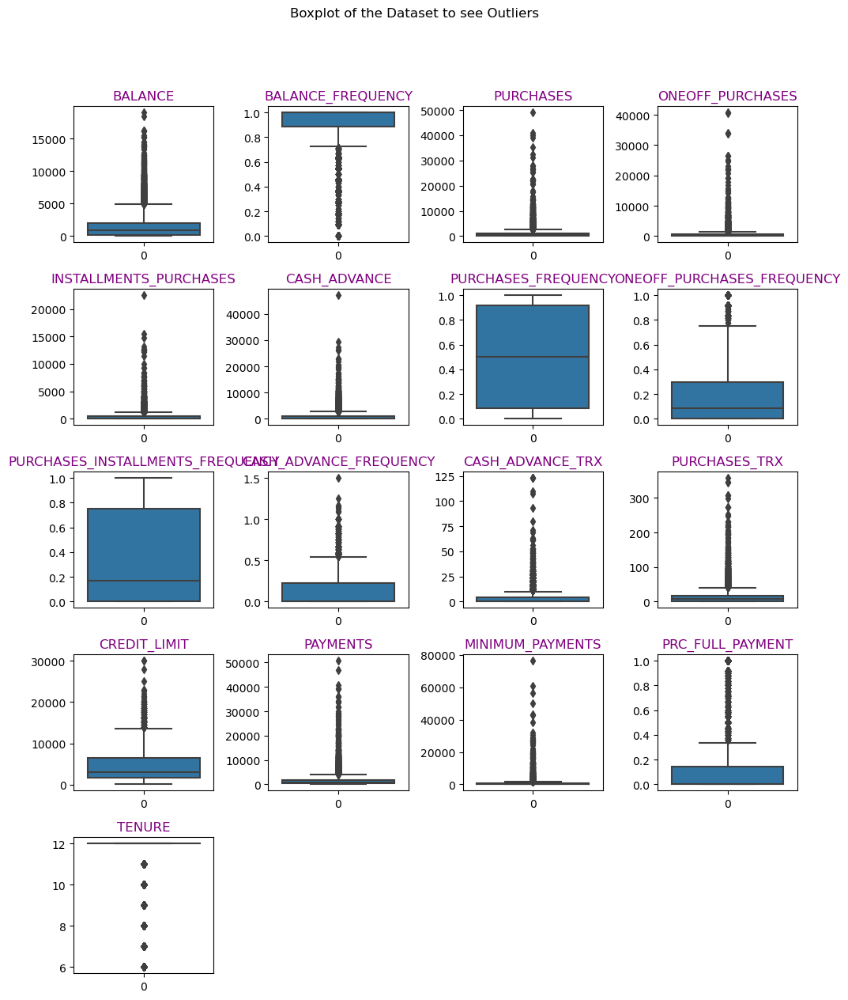

In [33]:
df2 = df1.iloc[:,1:]
# Plotting Boxplot to see if there are any outlier in any of the Columns
fig=plt.figure(figsize=(10,12))
fig.suptitle('Boxplot of the Dataset to see Outliers', y=1.05)
for i in range(0,df2.shape[1]):
    ax=fig.add_subplot(5,4,i+1)
    sns.boxplot(df2[df2.columns[i]])
    ax.set_title(df2.columns[i], color='purple')
    
plt.tight_layout()
plt.show()

In [35]:
# Calculating IQR
Q1 = df2.quantile(0.25)
Q3 = df2.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

BALANCE                             1925.858120
BALANCE_FREQUENCY                      0.111111
PURCHASES                           1070.495000
ONEOFF_PURCHASES                     577.405000
INSTALLMENTS_PURCHASES               468.637500
CASH_ADVANCE                        1113.821139
PURCHASES_FREQUENCY                    0.833334
ONEOFF_PURCHASES_FREQUENCY             0.300000
PURCHASES_INSTALLMENTS_FREQUENCY       0.750000
CASH_ADVANCE_FREQUENCY                 0.222222
CASH_ADVANCE_TRX                       4.000000
PURCHASES_TRX                         16.000000
CREDIT_LIMIT                        4900.000000
PAYMENTS                            1517.858151
MINIMUM_PAYMENTS                     693.348888
PRC_FULL_PAYMENT                       0.142857
TENURE                                 0.000000
dtype: float64


In [36]:
df3 = df2.copy()

# Replace every outlier on the lower side by the lower whisker
for i, j in zip(np.where(df3 < Q1 - 1.5 * IQR)[0], np.where(df3 < Q1 - 1.5 * IQR)[1]): 
    
    whisker  = Q1 - 1.5 * IQR
    df3.iloc[i,j] = whisker[j]
    
    
#Replace every outlier on the upper side by the upper whisker    
for i, j in zip(np.where(df3 > Q3 + 1.5 * IQR)[0], np.where(df3 > Q3 + 1.5 * IQR)[1]):
    
    whisker  = Q3 + 1.5 * IQR
    df3.iloc[i,j] = whisker[j]

In [37]:
# Checking the outliers now
df3_stat = df3.describe().T
df3_stat['Outliers present'] =  df3_stat.apply(Outlierdetection, axis=1)

In [38]:
df3_stat

,count,mean,std,min,25%,50%,75%,max,Outliers present
BALANCE,8950.0,1390.508973,1537.538479,0.000000,128.281915,873.385231,2054.140036,4942.927215,No
BALANCE_FREQUENCY,8950.0,0.931587,0.110984,0.722223,0.888889,1.000000,1.000000,1.000000,No
PURCHASES,8950.0,737.149330,879.534788,0.000000,39.635000,361.280000,1110.130000,2715.872500,No
ONEOFF_PURCHASES,8950.0,354.358139,511.823289,0.000000,0.000000,38.000000,577.405000,1443.512500,No
INSTALLMENTS_PURCHASES,8950.0,295.546214,396.181546,0.000000,0.000000,89.000000,468.637500,1171.593750,No
CASH_ADVANCE,8950.0,672.468924,998.514970,0.000000,0.000000,0.000000,1113.821139,2784.552848,No
PURCHASES_FREQUENCY,8950.0,0.490351,0.401371,0.000000,0.083333,0.500000,0.916667,1.000000,No
ONEOFF_PURCHASES_FREQUENCY,8950.0,0.184773,0.255668,0.000000,0.000000,0.083333,0.300000,0.750000,No
PURCHASES_INSTALLMENTS_FREQUENCY,8950.0,0.364437,0.397448,0.000000,0.000000,0.166667,0.750000,1.000000,No
CASH_ADVANCE_FREQUENCY,8950.0,0.126061,0.172676,0.000000,0.000000,0.000000,0.222222,0.555555,No


In [45]:
# # Doing the multivariate analysis using scatter plot.


sns.pairplot(df3, corner=1,height=15, aspect=4)

In [46]:
# Looking at the heatmap
df3_corr = df3.corr()
df3_corr

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
BALANCE,1.000000,0.403457,0.095805,0.124043,0.009457,0.557393,-0.108922,0.081477,-0.096473,0.497089,0.500925,0.057123,0.488516,0.350558,0.802934,-0.419972,NaN
BALANCE_FREQUENCY,0.403457,1.000000,0.184972,0.149539,0.161057,0.102849,0.222217,0.199187,0.180675,0.186646,0.175467,0.248062,0.107968,0.133318,0.306531,-0.183459,NaN
PURCHASES,0.095805,0.184972,1.000000,0.830603,0.706135,-0.177093,0.631891,0.683525,0.488919,-0.207612,-0.190023,0.808546,0.330410,0.501153,0.071449,0.212936,NaN
ONEOFF_PURCHASES,0.124043,0.149539,0.830603,1.000000,0.286764,-0.116870,0.408137,0.821933,0.152872,-0.127137,-0.117956,0.622341,0.321476,0.422124,0.045047,0.091038,NaN
INSTALLMENTS_PURCHASES,0.009457,0.161057,0.706135,0.286764,1.000000,-0.185467,0.688315,0.249382,0.780193,-0.220042,-0.200208,0.725475,0.191926,0.324137,0.052574,0.254259,NaN
CASH_ADVANCE,0.557393,0.102849,-0.177093,-0.116870,-0.185467,1.000000,-0.319499,-0.134830,-0.264589,0.769767,0.801425,-0.203801,0.258418,0.331303,0.420883,-0.227197,NaN
PURCHASES_FREQUENCY,-0.108922,0.222217,0.631891,0.408137,0.688315,-0.319499,1.000000,0.499498,0.862934,-0.336823,-0.315382,0.795194,0.118192,0.163930,-0.052645,0.316356,NaN
ONEOFF_PURCHASES_FREQUENCY,0.081477,0.199187,0.683525,0.821933,0.249382,-0.134830,0.499498,1.000000,0.143475,-0.121845,-0.118664,0.650300,0.293008,0.336919,0.007255,0.123273,NaN
PURCHASES_INSTALLMENTS_FREQUENCY,-0.096473,0.180675,0.488919,0.152872,0.780193,-0.264589,0.862934,0.143475,1.000000,-0.285161,-0.264110,0.700146,0.057750,0.120975,-0.023301,0.266671,NaN
CASH_ADVANCE_FREQUENCY,0.497089,0.186646,-0.207612,-0.127137,-0.220042,0.769767,-0.336823,-0.121845,-0.285161,1.000000,0.930204,-0.217631,0.128309,0.213939,0.360433,-0.268737,NaN


<Axes: >

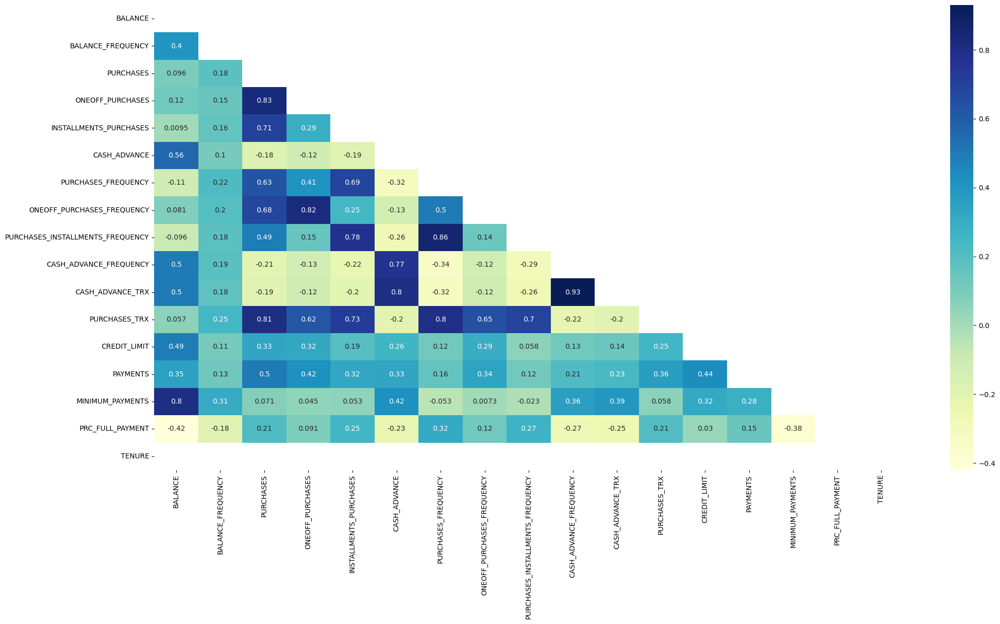

In [50]:
mask= np.triu(np.ones_like(df3.corr())) 
plt.figure(figsize=(24, 12))
sns.heatmap(df3.corr(), annot=True, cmap='YlGnBu', mask=mask,)

In [51]:
# Checking the scale of the dataset.
df4=df3.describe().T
df4['Range']=df4['max']-df4['min']
df4

,count,mean,std,min,25%,50%,75%,max,Range
BALANCE,8950.0,1390.508973,1537.538479,0.000000,128.281915,873.385231,2054.140036,4942.927215,4942.927215
BALANCE_FREQUENCY,8950.0,0.931587,0.110984,0.722223,0.888889,1.000000,1.000000,1.000000,0.277777
PURCHASES,8950.0,737.149330,879.534788,0.000000,39.635000,361.280000,1110.130000,2715.872500,2715.872500
ONEOFF_PURCHASES,8950.0,354.358139,511.823289,0.000000,0.000000,38.000000,577.405000,1443.512500,1443.512500
INSTALLMENTS_PURCHASES,8950.0,295.546214,396.181546,0.000000,0.000000,89.000000,468.637500,1171.593750,1171.593750
CASH_ADVANCE,8950.0,672.468924,998.514970,0.000000,0.000000,0.000000,1113.821139,2784.552848,2784.552848
PURCHASES_FREQUENCY,8950.0,0.490351,0.401371,0.000000,0.083333,0.500000,0.916667,1.000000,1.000000
ONEOFF_PURCHASES_FREQUENCY,8950.0,0.184773,0.255668,0.000000,0.000000,0.083333,0.300000,0.750000,0.750000
PURCHASES_INSTALLMENTS_FREQUENCY,8950.0,0.364437,0.397448,0.000000,0.000000,0.166667,0.750000,1.000000,1.000000
CASH_ADVANCE_FREQUENCY,8950.0,0.126061,0.172676,0.000000,0.000000,0.000000,0.222222,0.555555,0.555555


In [52]:
# As the range is on higher side, scaling would be done. Minmax technique is used for scaling
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler().fit(df3)
# transform the test test
df3_scaled = scaler.transform(df3)
df3_scaled=pd.DataFrame(df3_scaled, columns=df3.columns)
df3_scaled.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.0
mean,0.281313,0.753713,0.271423,0.245483,0.252260,0.241500,0.490351,0.246364,0.364437,0.226910,0.238313,0.283507,0.316616,0.322429,0.311779,0.244225,0.0
std,0.311058,0.399541,0.323850,0.354568,0.338156,0.358591,0.401371,0.340890,0.397448,0.310818,0.341788,0.318089,0.245200,0.304651,0.300408,0.388125,0.0
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
25%,0.025953,0.600000,0.014594,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,0.024390,0.112319,0.091738,0.089716,0.000000,0.0
50%,0.176694,1.000000,0.133025,0.026325,0.075965,0.000000,0.500000,0.111111,0.166667,0.000000,0.000000,0.170732,0.213768,0.205102,0.176246,0.000000,0.0
75%,0.415572,1.000000,0.408756,0.400000,0.400000,0.400000,0.916667,0.400000,0.750000,0.400000,0.400000,0.414634,0.467391,0.455043,0.453830,0.400000,0.0
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0


In [53]:
df3_scaled.head(10)

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,0.008275,0.345455,0.035127,0.000000,0.081428,0.000000,0.166667,0.000000,0.083333,0.00,0.0,0.048780,0.068841,0.048302,0.073254,0.000000,0.0
1,0.647889,0.672727,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.45,0.4,0.000000,0.503623,0.982075,0.563132,0.622222,0.0
2,0.504792,1.000000,0.284686,0.535617,0.000000,0.000000,1.000000,1.000000,0.000000,0.00,0.0,0.292683,0.539855,0.148894,0.329410,0.000000,0.0
3,0.337183,0.000000,0.551940,1.000000,0.000000,0.073903,0.083333,0.111111,0.000000,0.15,0.1,0.024390,0.539855,0.000000,0.453830,0.000000,0.0
4,0.165431,1.000000,0.005891,0.011084,0.000000,0.000000,0.083333,0.111111,0.000000,0.00,0.0,0.024390,0.083333,0.162362,0.128543,0.000000,0.0
5,0.366145,1.000000,0.490921,0.000000,1.000000,0.000000,0.666667,0.000000,0.583333,0.00,0.0,0.195122,0.126812,0.335109,1.000000,0.000000,0.0
6,0.126901,1.000000,1.000000,1.000000,0.587559,0.000000,1.000000,1.000000,1.000000,0.00,0.0,1.000000,0.974638,1.000000,0.104005,1.000000,0.0
7,0.368942,1.000000,0.160611,0.000000,0.372313,0.000000,1.000000,0.000000,1.000000,0.00,0.0,0.292683,0.163043,0.162537,0.279389,0.000000,0.0
8,0.205329,1.000000,0.317206,0.458250,0.170708,0.000000,0.333333,0.111111,0.250000,0.00,0.0,0.121951,0.503623,0.164742,0.163818,0.000000,0.0
9,0.030797,0.000000,0.471893,0.887834,0.000000,0.000000,0.166667,0.222223,0.000000,0.00,0.0,0.073171,0.793478,0.278792,0.052664,0.000000,0.0


In [ ]:
# Applying hierarchical clustering to scaled data. Identify the number of optimum clusters 
# using Dendrogram and briefly describe them


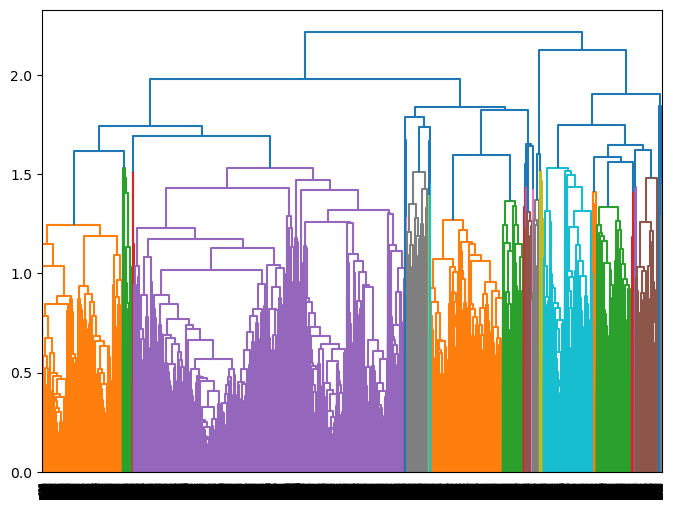

In [54]:
# importing the library
# Using average linkage method
from scipy.cluster.hierarchy import dendrogram, linkage

link = linkage(df3_scaled, method = 'average')
plt.figure(figsize=(8,6))
dend = dendrogram(link)

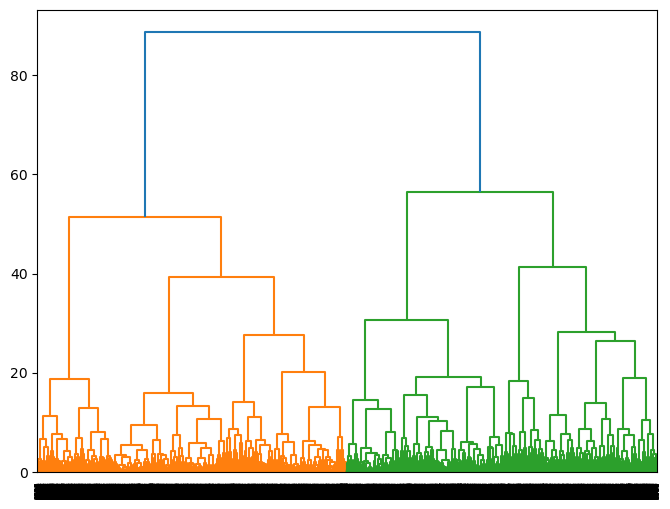

In [55]:

# Using ward linkage method
from scipy.cluster.hierarchy import dendrogram, linkage

link1 = linkage(df3_scaled, method = 'ward')
plt.figure(figsize=(8,6))
dend = dendrogram(link1)

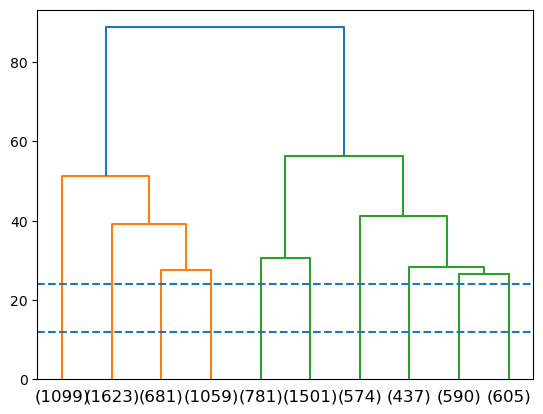

In [56]:
# Using the ward method shown 3-4 distinct clusters, 
# Visualizing the dendrogram with limited clusters and plotting horizontal lines on the cluster heads

dend=dendrogram (link1,truncate_mode='lastp',p=10)
plt.axhline(linestyle='--', y=12)
plt.axhline(linestyle='--', y=24)

In [ ]:
# We can assume 3 clusters from above dendrogram

In [57]:
# Assigning the number of clusters using maxcluster 

from scipy.cluster.hierarchy import fcluster

cluster_maxcluster = fcluster(link1, 3, criterion = 'maxclust')
cluster_maxcluster

array([1, 1, 3, ..., 2, 1, 1], dtype=int32)

In [62]:
# Assigning cluster ID to the dataset


df_hierarchical = df.iloc[:,1:].copy()
df_hierarchical['Hierarchical_Clusters'] = cluster_maxcluster
df_hierarchical.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,Hierarchical_Clusters
0,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12,1
1,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12,1
2,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12,3
3,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12,1
4,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12,1


In [64]:
# Analyzing the cluster of customers

df5 = df_hierarchical.groupby('Hierarchical_Clusters').agg([np.mean, np.sum])
df5['Cluster_volume'] = df_hierarchical['Hierarchical_Clusters'].value_counts().sort_index()


In [65]:
pd.set_option('display.max_columns', None)
df5

BALANCE               BALANCE_FREQUENCY  \
                              mean           sum              mean   
Hierarchical_Clusters                                                
1                      1620.660488  7.231387e+06          0.807469   
2                       747.277895  1.705288e+06          0.920612   
3                      2296.180623  5.065374e+06          0.973623   

                                      PURCHASES             ONEOFF_PURCHASES  \
                               sum         mean         sum             mean   
Hierarchical_Clusters                                                          
1                      3602.925224   196.817869   878201.33       153.379388   
2                      2100.835868   803.588953  1833789.99       105.306328   
3                      2147.811902  2840.748840  6266691.94      1984.418223   

                                  INSTALLMENTS_PURCHASES              \
                              sum                   mean         sum   
Hierarchical_Clusters                                                  
1                       684378.83              43.555592   194345.05   
2                       240309.04             699.209479  1595596.03   
3                      4377626.60             856.352829  1889114.34   

                      CASH_ADVANCE               PURCHASES_FREQUENCY  \
                              mean           sum                mean   
Hierarchical_Clusters                                                  
1                      1368.480707  6.106161e+06            0.146325   
2                       109.498042  2.498745e+05            0.831207   
3                      1090.145518  2.404861e+06            0.833600   

                                   ONEOFF_PURCHASES_FREQUENCY               \
                               sum                       mean          sum   
Hierarchical_Clusters                                                        
1                       652.900453                   0.077321   345.005956   
2                      1896.814497                   0.065205   148.798639   
3                      1838.922458                   0.597548  1318.191673   

                      PURCHASES_INSTALLMENTS_FREQUENCY               \
                                                  mean          sum   
Hierarchical_Clusters                                                 
1                                             0.067293   300.259735   
2                                             0.779136  1777.987945   
3                                             0.536476  1183.466527   

                      CASH_ADVANCE_FREQUENCY             CASH_ADVANCE_TRX  \
                                        mean         sum             mean   
Hierarchical_Clusters                                                       
1                                   0.192923  860.821041         4.549305   
2                                   0.031198   71.192816         0.559597   
3                                   0.125805  277.526736         3.400272   

                             PURCHASES_TRX        CREDIT_LIMIT                \
                         sum          mean    sum         mean           sum   
Hierarchical_Clusters                                                          
1                      20299      2.431197  10848  4029.221672  1.797436e+07   
2                       1277     16.941280  38660  3357.226626  7.661191e+06   
3                       7501     37.237081  82145  6611.640567  1.458528e+07   

                          PAYMENTS               MINIMUM_PAYMENTS  \
                              mean           sum             mean   
Hierarchical_Clusters                                               
1                      1411.053650  6.296121e+06       815.081623   
2                      1016.332337  2.319270e+06       828.142494   
3                      3126.131323  6.896246e+06       996.410427   

    

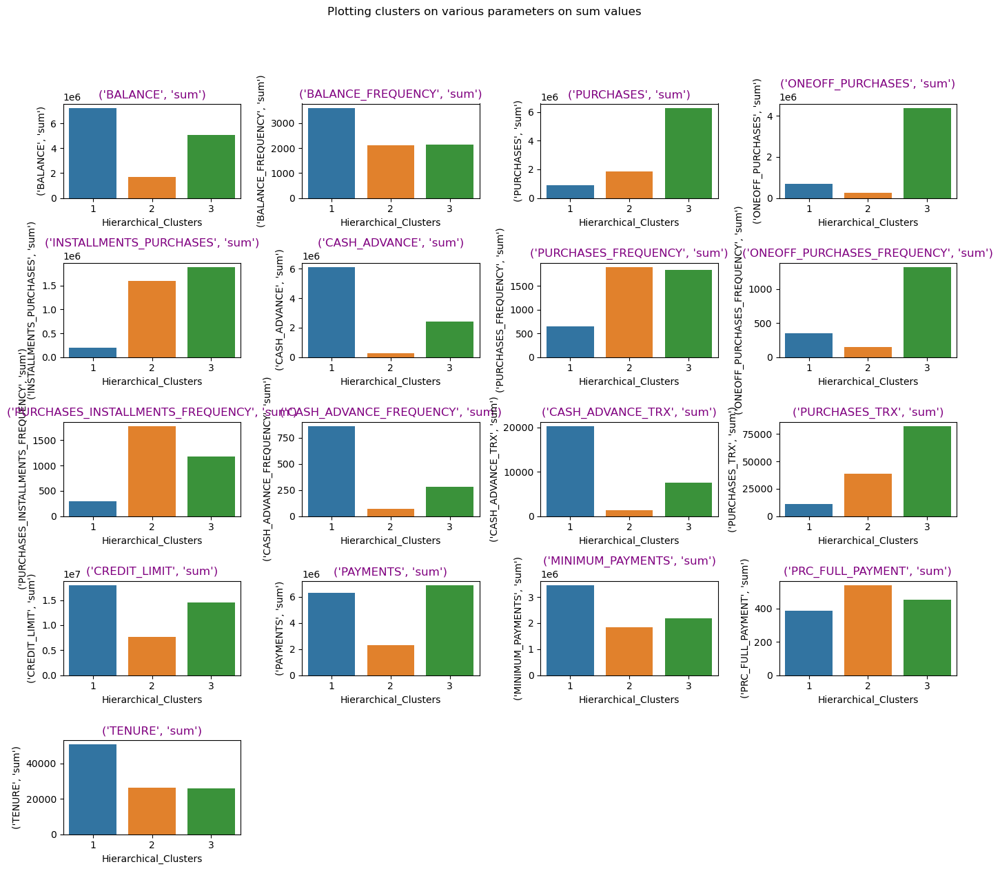

In [102]:
df_filtered_sum = df5.filter(like='sum')
# Plotting barplot for sum values to see characteristics of 3 clusters formed
fig=plt.figure(figsize=(14,12))
fig.suptitle('Plotting clusters on various parameters on sum values', y=1.05)
for i in range(0,df_filtered_sum.shape[1]):
    ax=fig.add_subplot(5,4,i+1)
    sns.barplot(data=df_filtered_sum, x=df_filtered_sum.index, y=df_filtered_sum.columns[i], dodge=True, ax=ax)
    ax.set_title(df_filtered_sum.columns[i], color='purple')
    
plt.tight_layout()
plt.show()

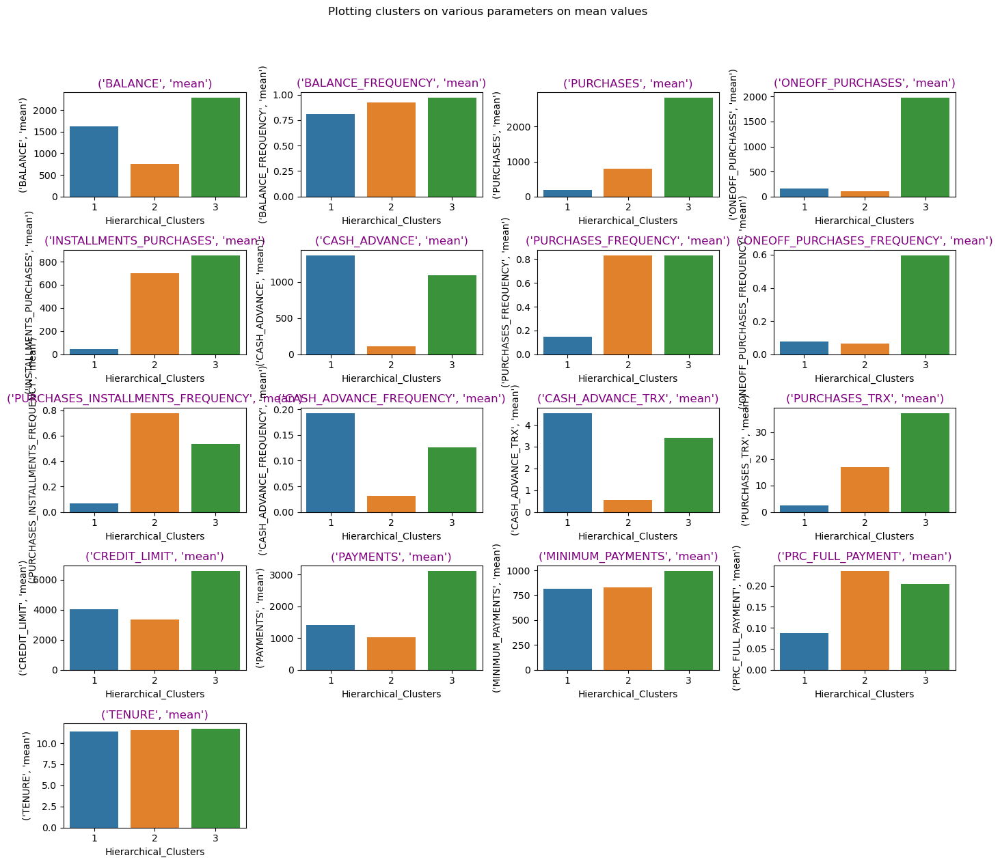

In [103]:
df_filtered_mean = df5.filter(like='mean')
# Plotting barplot for sum values to see characteristics of 3 clusters formed
fig=plt.figure(figsize=(14,12))
fig.suptitle('Plotting clusters on various parameters on mean values', y=1.05)
for i in range(0,df_filtered_mean.shape[1]):
    ax=fig.add_subplot(5,4,i+1)
    sns.barplot(data=df_filtered_mean, x=df_filtered_mean.index, y=df_filtered_mean.columns[i], dodge=True, ax=ax)
    ax.set_title(df_filtered_mean.columns[i], color='purple')
    
plt.tight_layout()
plt.show()

# Inferences:

Cluster 1 : Cluster 1 customers do not have high purchase frequencies. They are seen to withdraw cash in advance. Even installment
purchases are too less. They have less credit limit and they hardly make full payments.

Cluster 2 : They have higher purchase frequencies than Cluster 1. However they maintain less CC balance. They make full payments
and hardly withdraw cash. They purchase more on installments.

Cluster 3 : They have highest purchase power, and maintain good CC balance. High one off purchases and also withdraw Cash advances
They make higher minimum payments and credit limit is also higher.    